In [138]:
# !pip install folium
# !pip install reverse_geocoder pycountry_convert
# !pip install plotly pandas

In [139]:
# from google.colab import drive
# drive.mount('/content/drive')

In [140]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import reverse_geocoder as rg
import pycountry_convert as pc

In [141]:
df=pd.read_csv('/content/Earthquake dataset 2024-2025.csv')
# df=pd.read_csv("/content/drive/MyDrive/Montclair assignments/EDA/Project 2/Earthquake dataset 2024-2025.csv")

In [142]:
# Preparing coordinates for the geocoder
coords = list(zip(df['latitude'], df['longitude']))
results = rg.search(coords)

df['time'] = pd.to_datetime(df['time'], errors='coerce')

# Extracting Country and Admin Region (State/Province)
# 'cc' = Country Code (e.g., US, JP), 'admin1' = Region (e.g., California)
df['country_code'] = [x['cc'] for x in results]
df['region'] = [x['admin1'] for x in results]

# Function to map Country Code -> Continent
def get_continent(country_code):
    try:
        # Convert 2-letter country code to Continent Code
        continent_code = pc.country_alpha2_to_continent_code(country_code)
        # Map Code to Full Name
        continents = {
            'NA': 'North America', 'SA': 'South America', 'AS': 'Asia',
            'OC': 'Oceania', 'AF': 'Africa', 'EU': 'Europe', 'AN': 'Antarctica'
        }
        return continents.get(continent_code, 'Other')
    except:
        return 'Other' # Handle oceans or unmatched codes

# Applying the function
df['continent'] = df['country_code'].apply(get_continent)


In [143]:
df

,Unnamed: 0,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,...,horizontalError,depthError,magError,magNst,status,locationSource,magSource,country_code,region,continent
0,0,2024-12-31 23:28:55.746000+00:00,9.177200,40.0124,10.000,4.30,mb,23.0,134.0,3.6390,...,11.66,1.953,0.142000,14.0,reviewed,us,us,ET,Afar,Africa
1,1,2024-12-31 23:13:20.048000+00:00,-20.182600,-70.6231,35.000,5.00,mwr,37.0,129.0,0.4700,...,3.29,1.918,0.061000,26.0,reviewed,us,us,CL,Tarapaca,South America
2,2,2024-12-31 22:51:02.867000+00:00,8.790500,40.2074,10.000,4.30,mb,23.0,230.0,1.5130,...,5.83,2.014,0.142000,14.0,reviewed,us,us,ET,Afar,Africa
3,3,2024-12-31 22:45:49.069000+00:00,9.050000,40.0003,10.000,4.30,mb,26.0,68.0,1.3140,...,7.23,1.783,0.133000,16.0,reviewed,us,us,ET,Oromiya,Africa
4,4,2024-12-31 22:32:02.906000+00:00,8.012700,127.2640,10.000,4.60,mb,45.0,116.0,1.9150,...,10.20,1.913,0.091000,36.0,reviewed,us,us,PH,Davao,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50411,12805,NaT,-25.343600,-70.5175,35.000,4.30,mb,19.0,178.0,0.8040,...,3.99,1.966,0.239000,5.0,reviewed,us,us,CL,Antofagasta,South America
50412,12806,2024-01-01 00:59:19.656000+00:00,-6.859900,107.1224,178.051,4.10,mb,43.0,97.0,0.4900,...,6.71,5.273,0.102000,26.0,reviewed,us,us,ID,West Java,Asia
50413,12807,2024-01-01 00:54:44.947000+00:00,-57.304500,-25.8967,55.881,4.40,mb,18.0,107.0,6.6940,...,8.65,8.639,0.156000,12.0,reviewed,us,us,GS,,South America
50414,12808,2024-01-01 00:37:09.096000+00:00,17.662500,145.4596,384.941,4.70,mb,198.0,36.0,2.4290,...,10.13,5.448,0.042000,168.0,reviewed,us,us,MP,Saipan,Oceania


In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50416 entries, 0 to 50415
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   Unnamed: 0       50416 non-null  int64              
 1   time             50300 non-null  datetime64[ns, UTC]
 2   latitude         50416 non-null  float64            
 3   longitude        50416 non-null  float64            
 4   depth            50416 non-null  float64            
 5   mag              50416 non-null  float64            
 6   magType          50416 non-null  object             
 7   nst              47555 non-null  float64            
 8   gap              47551 non-null  float64            
 9   dmin             47470 non-null  float64            
 10  rms              50415 non-null  float64            
 11  net              50416 non-null  object             
 12  id               50416 non-null  object             
 13  updated         

## **1. Map Visualization**

##1.1 Choropleth Map
**Design Description**

This visualization uses a **Choropleth Map** to compare earthquake intensity across countries.

- **Regions Displayed**:   Countries on the world map. The country name is extracted from the place column by splitting the text and taking the last part (for example, "27 km NNW of Awash, Ethiopia" → "Ethiopia").

- **Aggregation**:  For every country, two summary values are calculated from the dataset:  
  • **Average Magnitude (avg_mag)** – mean of all earthquake magnitudes in that country  
  • **Number of Earthquakes (quake_count)** – total count of earthquakes recorded in that country  

- **Color Encoding**:  Countries are colored based on their **average magnitude** using Plotly’s **Reds** continuous color scale.  Darker red indicates countries with **stronger earthquakes on average**.

- **Interactivity**:  Hovering over a country displays:  
  • Country name  
  • Average magnitude (formatted to 2 decimal places)  
  • Total number of earthquakes in that country  

This design provides a clear comparison of earthquake strength at the **country level**, while still allowing users to access exact statistics through interactive tooltips on the map.



In [145]:
#Choropleth Map

df["country"] = df["place"].str.split(",").str[-1].str.strip()

country_summary = df.groupby("country", as_index=False).agg(
    avg_mag=("mag", "mean"),
    quake_count=("mag", "size")
)

fig2 = px.choropleth(
    country_summary,
    locations="country",
    locationmode="country names",
    color="avg_mag",
    hover_name="country",
    hover_data={"avg_mag": ':.2f', "quake_count": True},
    color_continuous_scale="Reds",
    title="Average Earthquake Magnitude by Country (2024–2025)"
)

fig2.update_layout(
    width=1800,
    height=600,
    title_x=0.5,
    margin=dict(l=0, r=0, t=40, b=0)
)

fig2.show()

## 1.2 Bubble Map: Global Earthquake Distribution

This visualization plots the geospatial distribution of seismic events using an **OpenStreetMap** base layer. It provides an immediate global overview of tectonic activity, highlighting high-impact zones such as the "Ring of Fire."

### Visual Encoding
* **Location (`lat`, `lon`)**: Maps the precise epicenter of each event.
* **Magnitude (`mag`)**: Utilizes a **double encoding** strategy where both the **Size** and **Color** of the bubbles represent the earthquake's magnitude.



In [146]:
#Bubble Map
fig_map = px.scatter_mapbox(
    df,
    lat="latitude",
    lon="longitude",
    color="mag",                # Color points by Magnitude
    size="mag",                 # Size of bubbles by Magnitude
    hover_name="place",         # Show place name on hover
    hover_data=["depth", "time", "type"],
    color_continuous_scale=px.colors.cyclical.IceFire,
    # size_max=15,                # Cap the bubble size
    zoom=1,                     # Initial zoom level (1 = whole world)
    mapbox_style="open-street-map", # Free map style (no token needed)
    title="Global Earthquake Distribution by Magnitude"
)

# Update layout to remove margins for a cleaner look
fig_map.update_layout(margin={"r":0,"t":40,"l":0,"b":0})

fig_map.show()

##1.3 Density Map (Heatmap)

### Design Description
This visualization uses a **Density Map** (or Heatmap) design.
- **Concept**: It aggregates points to show the intensity or concentration of earthquakes in specific regions.
- **Weight**: The heatmap intensity is weighted by **Magnitude**, meaning areas with stronger or more frequent earthquakes will appear "hotter".
- **Utility**: This is excellent for identifying tectonic plate boundaries and "hotspots" of seismic activity without the visual clutter of individual points.

This complements the Bubble Map by providing a high-level view of seismic zones.

In [147]:
# Density Map
fig2 = px.density_mapbox(df,
                         lat='latitude',
                         lon='longitude',
                         z='mag',
                         radius=15,
                         center=dict(lat=0, lon=0),
                         zoom=1,
                         height=900,
                         mapbox_style="carto-positron",
                         title="Earthquake Density Heatmap (Weighted by Magnitude)")

fig2.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig2.show()

## **2. Aggregation Visualization**

## 2.1 Histogram

This is a Histogram (the bars) overlaid with a Kernel Density Estimate (KDE) (the smooth line).

* The Bars: Count exactly how many earthquakes happened within specific magnitude ranges (bins).

* The Line: smooths out those bars to show the overall "shape" or probability of the data.



* X-Axis: Earthquake Magnitude:

  This is the power of the earthquake (e.g., 2.5, 5.0, 7.0).


* Y-Axis: Number of Earthquakes (Frequency):

  This is the count of events.







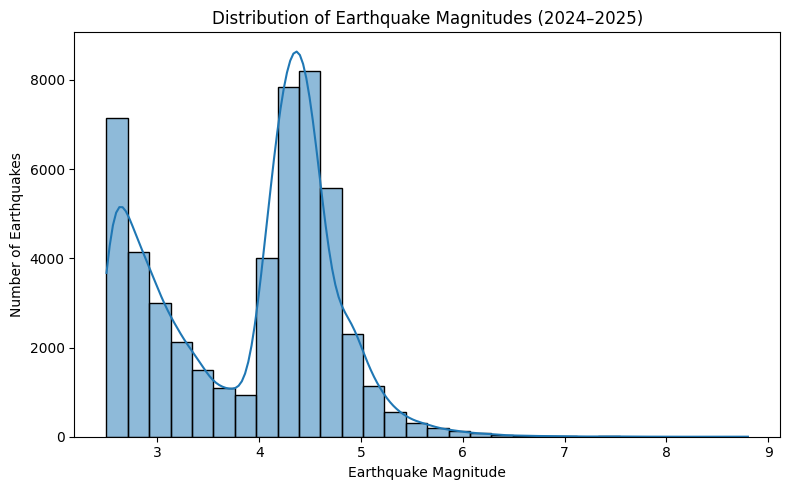

In [148]:
import seaborn as sns


mag = df["mag"].dropna()

plt.figure(figsize=(8, 5))
sns.histplot(mag, bins=30, kde=True)

plt.xlabel("Earthquake Magnitude")
plt.ylabel("Number of Earthquakes")
plt.title("Distribution of Earthquake Magnitudes (2024–2025)")
plt.tight_layout()
plt.show()


We picked this to visualize the Gutenberg-Richter Law (a fundamental principle in seismology). **This law states that for every increase in magnitude, the number of earthquakes drops exponentially.**


* We can see a huge spike on the left (small magnitudes) and a long, flat tail on the right (large magnitudes).

* Left Side (High Count): Small earthquakes happen all the time. There are thousands of magnitude 2.5–3.0 quakes every year.

* Right Side (Low Count): Massive earthquakes (7.0+) are extremely rare. The line drops to near zero because these are "Black Swan" events.

* The Cut-off (Left Edge): The graph doesn't start at 0.0 magnitude. It likely starts around 2.5 or 4.0. This is the "Detection Limit". We physically cannot detect magnitude 1.0 earthquakes so they are "missing" from the data.


**Summary:**

This plot confirms the expected exponential decay of earthquake frequency. It shows that while small tremors are daily occurrences, high-magnitude events that cause significant damage are statistically rare outliers.

## 2.2 Box Plot

This plot compares different methods of calculating earthquake magnitude. In seismology, there isn't just one "Richter Scale"; there are many different formulas used depending on how big the earthquake is and how far away the sensor is.

In this Box Plot, we are explaining "Measurement Consistency" showing that different scales are used for different ranges of power. For example, for mww (used for huge quakes) has a much higher average magnitude than md (used for tiny local quakes).

/tmp/ipython-input-1327888767.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




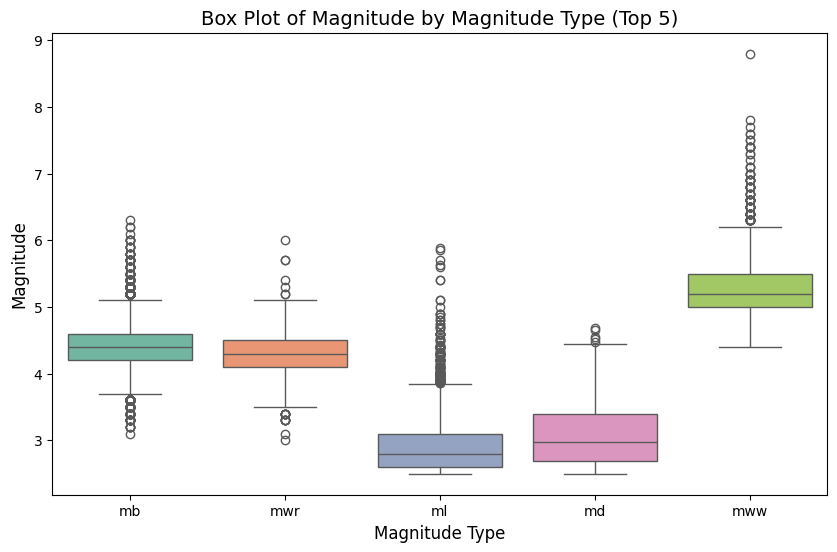

In [149]:
top_mag_types = df['magType'].value_counts().nlargest(5).index
df_filtered = df[df['magType'].isin(top_mag_types)]

plt.figure(figsize=(10, 6))
sns.boxplot(x='magType', y='mag', data=df_filtered, palette='Set2')
plt.title('Box Plot of Magnitude by Magnitude Type (Top 5)', fontsize=14)
plt.xlabel('Magnitude Type', fontsize=12)
plt.ylabel('Magnitude', fontsize=12)
plt.savefig('magnitude_boxplot.png')
plt.show()

**The "Types" in Top 5:**


1. mb (Body-Wave Magnitude)

It measures the amplitude of "Body Waves" (P-waves) that travel deep through the Earth's interior.
This is the standard measurement for medium-sized earthquakes (usually magnitude 4.0 – 6.5) measured from a distance (tele-seismic).
It’s the most common type in global datasets because body waves travel everywhere, but it "saturates" (stops getting bigger) for truly massive earthquakes.

2. ml (Local Magnitude / "Richter Scale")

It measures the amplitude of ground shaking on a specific type of instrument (Wood-Anderson seismograph) nearby.
This is the original "Richter Scale." It is used for local, smaller earthquakes (typically < 6.0) that are close to the sensor.
It doesn't work well for long distances. If we see ml, the quake likely happened near the recording station.

3. md (Duration Magnitude)

Instead of measuring height (amplitude), this measures how long the shaking lasts (duration) on the recording.
Used for small earthquakes (often < 4.0) where the shake is too small to get a clear "height" measurement, or for local networks.
This is often seen in clusters of small tremors or aftershocks.

4. mww (Moment Magnitude - W-phase)

It measures the total physical energy released. It looks at very long "W-waves" that ripple through the mantle.
This is the modern "Gold Standard" for major earthquakes (Magnitude 5.0 to 9.0+).
Unlike mb or ml, this scale does not "saturate." It is the most accurate measure for the huge, destructive earthquakes we see in the news.

5. mwr (Regional Moment Magnitude)

It's similar to mww (calculating total energy), but calculated using "Regional" sensors (closer to the source) rather than global ones.
Used for medium-to-large earthquakes where we have good data from nearby stations.


**Summary:**

In this plot, we are showing that Magnitude is not just one number; it is a calculation that depends on the method used.

mww will appear high on the chart (showing the biggest quakes).

md and ml will likely be lower (showing smaller, local quakes).

## **3. Interactive Visualization**

##3.1 Interactive 3D Bubble Plot
## 3D Seismic Profile: Depth vs. Magnitude by Continent

This visualization separates the data into distinct "planes" based on the continent, allowing for a clear comparison of seismic structure.

### Visual Encoding
* **X-Axis (Continent)**: Categorical separation. This arranges the data into parallel slices, making it easy to isolate and compare specific continental regions side-by-side.
* **Y-Axis (Depth)**: Shows how deep the earthquakes occur. You can look for "vertical columns" of dots which often indicate subduction zones.
* **Z-Axis (Magnitude)**: The vertical height represents the intensity of the quake.
* **Size & Color**: Both are mapped to **Magnitude** and **Continent** respectively, reinforcing the spatial separation and highlighting the strongest events.


In [150]:
fig_compare = px.scatter_3d(
    df,
    x='continent',
    y='depth',
    z='mag',
    color='continent',
    size='mag',
    size_max=10,
    opacity=0.6,
    height=800,
)

fig_compare.update_layout(scene=dict(zaxis_title='Magnitude',yaxis_title='Depth',xaxis_title='Continent'))
fig_compare.show()

**1.Map Visualization (Interactive with Zoom/Pan)**

Requirement Met: Map visualization & Heatmaps with hover interactions

This visualization plots every earthquake on an interactive world map.

Color: Represents Magnitude (mag). Darker/Different colors = Stronger quakes.

Hover: Hovering over a point shows the specific location (place) and depth.

Interactivity: You can zoom in to street level or pan across the globe.

# 3.2: Time-Series with Range Slider (Scrubbing)
# Interactive Timeline: Magnitude & Frequency Analysis

This visualization plots every seismic event chronologically, providing a granular view of earthquake frequency and intensity over time.

### Visual Encoding
* **X-Axis (Time)**: The primary dimension, plotting the exact timestamp of every event.
* **Y-Axis (Magnitude)**: Vertical position indicates the strength of the quake.
* **Color (Depth)**: The color gradient represents the depth of the hypocenter, allowing users to spot trends such as "deep" vs. "shallow" earthquake swarms.
* **Opacity**: Set to `0.6`, the transparency helps visualize density. Darker, more saturated areas indicate periods of intense, overlapping activity (aftershock sequences).


In [151]:
fig_time = px.scatter(
    df,
    x="time",
    y="mag",
    color="depth",
    hover_data=["place"],
    title="Earthquake Magnitude Over Time",
    opacity=0.6,
    color_continuous_scale="magma")


fig_time.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=7, label="1w", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig_time.show()